In [1]:
from enum import Enum
from typing import Dict, List, Literal, Optional, Tuple

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes

from targets.hpolib.api import DatasetChoices, HPOBench
hpolib_choices = [d.name for d in DatasetChoices]

from targets.nasbench101.api import NASBench101, SearchSpaceChoices
nb101_choices = [d.name for d in SearchSpaceChoices]

from targets.nasbench201.api import DatasetChoices, NASBench201
nb201_choices = [d.name for d in DatasetChoices]

from util.visualization_helper import DataCollector, ExperimentCollector


plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.size"] = 18
plt.rcParams['mathtext.fontset'] = 'stix'  # The setting of math font
%matplotlib inline

BENCH_CHOICES = {
    'hpolib': hpolib_choices,
    'nasbench101': nb101_choices,
    'nasbench201': nb201_choices
}

COLOR_DICT = {
    'tpe': 'red',
    'KA_tpe': 'blue',
    'vanilla_tpe': 'black',
    'random_search': 'olive',
    'nsga2': 'magenta',
    'cbo': 'lime',
    'hm': 'cyan'
}

LABEL_DICT = {
    'slice_localization': 'Slice Localization',
    'protein_structure': 'Protein Structure',
    'naval_propulsion': 'Naval Propulsion',
    'parkinsons_telemonitoring': 'Parkinsons Telemonitoring',
    'cifar10A': 'CIFAR10A',
    'cifar10B': 'CIFAR10B',
    'cifar10C': 'CIFAR10C',
    'imagenet': 'ImageNet',
    'cifar10': 'CIFAR10',
    'cifar100': 'CIFAR100',
    'hpolib': 'HPOlib',
    'nasbench101': 'NAS-Bench-101',
    'nasbench201': 'NAS-Bench-201',
    'KA_tpe': 'c-TPE + KA',
    'vanilla_tpe': 'Vanilla TPE',
    'tpe': 'c-TPE',
    'random_search': 'Random',
    'nsga2': 'CNSGA-II',
    'hm': 'HM2',
    'cbo': 'NEI',
    'runtime': 'Runtime',
    'runtime,n_params': 'Runtime and Network size',
    'n_params,runtime': 'Runtime and Network size',
    'runtime,size_in_mb': 'Runtime and Network size',
    'size_in_mb,runtime': 'Runtime and Network size',
    'n_params': 'Network size',
    'size_in_mb': 'Network size'
}

OPT_NAMES = list(COLOR_DICT.keys())
OPT_NAMES_NO_KA = [opt_name for opt_name in OPT_NAMES if opt_name != 'KA_tpe']
TRUE_GAMMA_STR = '$\gamma_{c_i^\star}^{\mathrm{true}}$'
CONSTRAINT_CHOICES = [['runtime', 'n_params'], ['n_params'], ['runtime']]
DOMAIN_CHOICES = list(range(10, 100, 10))
CONSTRAINT_PARAPHRASE = {
    'runtime': 'runtime',
    'n_params': 'n_params',
    'size_in_mb': 'n_params',
    'n_params,runtime': 'runtime,n_params',
    'runtime,n_params': 'runtime,n_params'
}


def get_constraint_tag(constraint_keys):
    return CONSTRAINT_PARAPHRASE[",".join([CONSTRAINT_PARAPHRASE[k] for k in constraint_keys])]


def get_constraint_directory(constraint_keys):
    return f'results/{get_constraint_tag(constraint_keys)}'


def get_constraint_suffix(constraint_keys):
    return '-and-'.join([CONSTRAINT_PARAPHRASE[k] for k in constraint_keys])


def get_opt_names(constraint_keys):
    return OPT_NAMES_NO_KA[:] if constraint_keys == ['runtime'] else OPT_NAMES[:]


def modify_constraint_keys(bench_name, constraint_keys):
    if bench_name == 'nasbench201' and 'n_params' in constraint_keys:
        return [k if k != 'n_params' else 'size_in_mb' for k in constraint_keys]
    else:
        return constraint_keys

# Average rank over time for each domain size  

HPOlib: Slice Localization
HPOlib: Protein Structure
HPOlib: Naval Propulsion
HPOlib: Parkinsons Telemonitoring
NAS-Bench-101: CIFAR10A
NAS-Bench-101: CIFAR10B
NAS-Bench-201: ImageNet
NAS-Bench-201: CIFAR10
NAS-Bench-201: CIFAR100
HPOlib: Slice Localization
HPOlib: Protein Structure
HPOlib: Naval Propulsion
HPOlib: Parkinsons Telemonitoring
NAS-Bench-101: CIFAR10A
NAS-Bench-101: CIFAR10B
NAS-Bench-201: ImageNet
NAS-Bench-201: CIFAR10
NAS-Bench-201: CIFAR100
HPOlib: Slice Localization
HPOlib: Protein Structure
HPOlib: Naval Propulsion
HPOlib: Parkinsons Telemonitoring
NAS-Bench-101: CIFAR10A
NAS-Bench-101: CIFAR10B
NAS-Bench-201: ImageNet
NAS-Bench-201: CIFAR10
NAS-Bench-201: CIFAR100


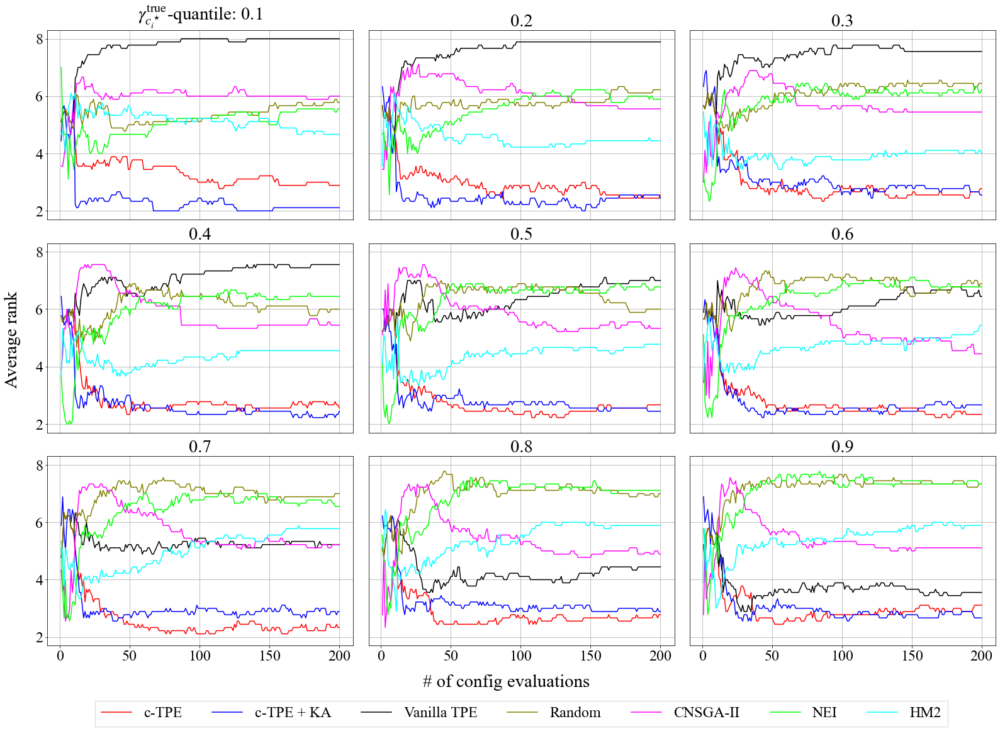

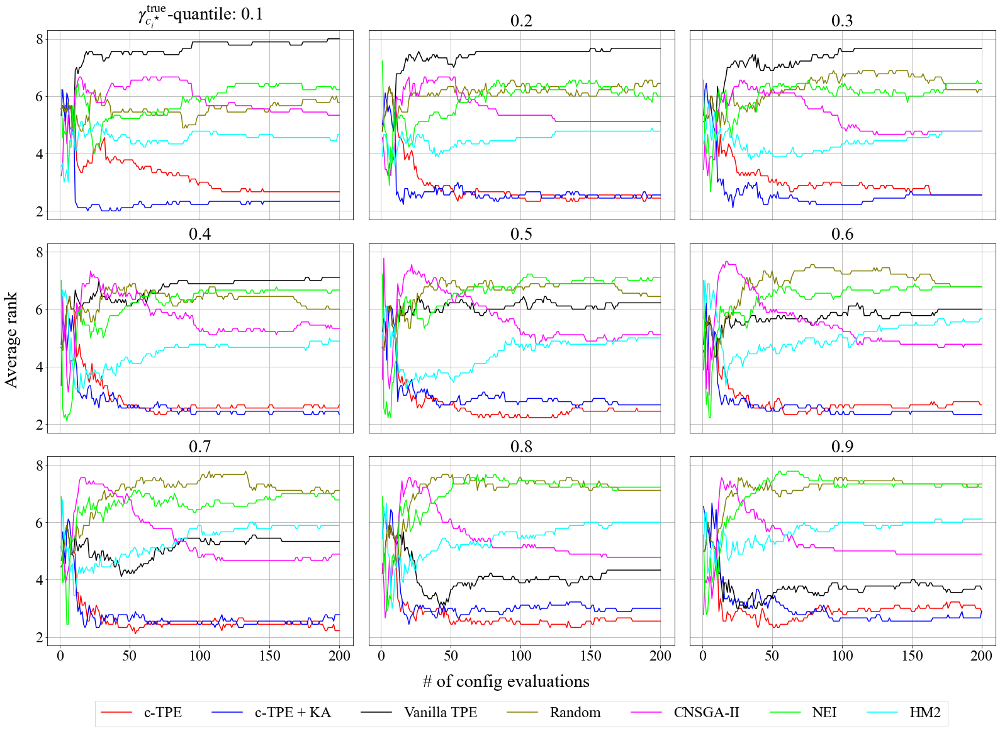

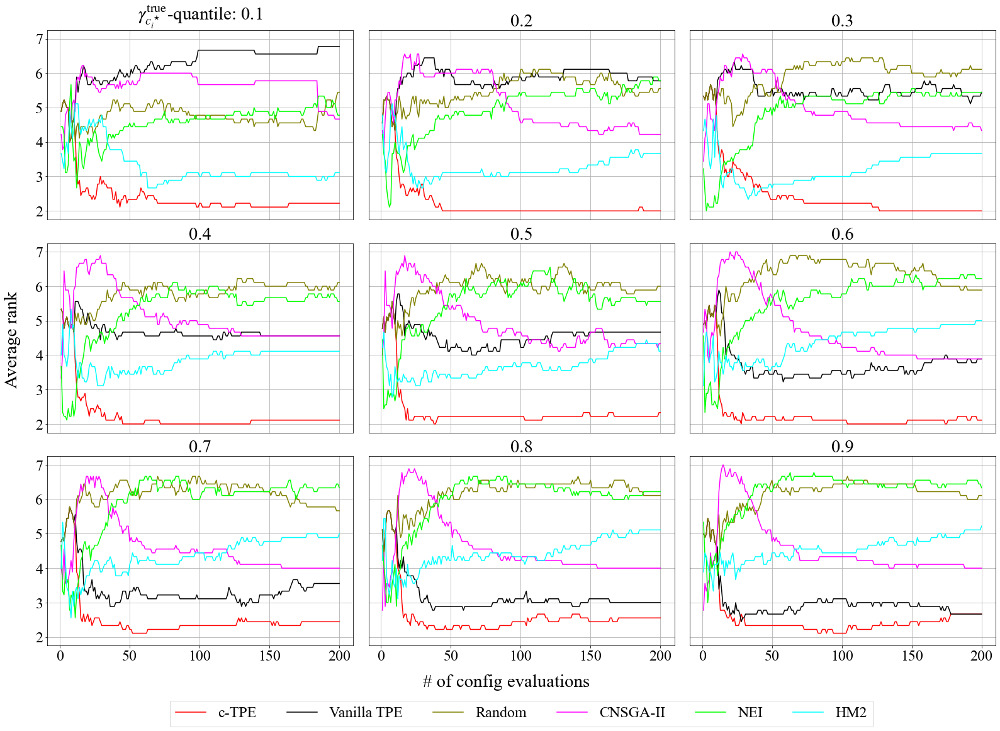

In [2]:
plt.rcParams["font.size"] = 24
max_evals = 200
X = np.arange(max_evals) + 1


def update(rank_dict, new_data):
    for domain_size, d in new_data.items():
        for opt_name, rank in d.items():
            rank_dict[domain_size][opt_name] += rank
            counter[domain_size][opt_name] += 1


def get_init_dicts(X, opt_names):
    init_rank = np.zeros_like(X, dtype=np.float32)
    init_rank_dict = {
        domain_size: {opt_name: init_rank.copy() for opt_name in opt_names} 
        for domain_size in DOMAIN_CHOICES
    }
    init_counter = {
        domain_size: {opt_name: 0.0 for opt_name in opt_names}
        for domain_size in DOMAIN_CHOICES
    }
    return init_rank_dict, init_counter


def update_counter(counter, rank_dict):
    for domain_size, d in rank_dict.items():
        for opt_name, rank in d.items():
            rank_dict[domain_size][opt_name] /= counter[domain_size][opt_name]

        
def update_by_bench(rank_dict, bench_name, constraint_keys, remove=None):
    choices = BENCH_CHOICES[bench_name]
    dir_name, opt_names = get_constraint_directory(constraint_keys), get_opt_names(constraint_keys)
    opt_names = [name for name in opt_names if name != remove]
    n_benchs = len(choices)
    constraint_keys = modify_constraint_keys(bench_name, constraint_keys)

    for choice in choices:
        if choice == 'cifar10C':
            continue

        print(f'{LABEL_DICT[bench_name]}: {LABEL_DICT[choice]}')
        ec = ExperimentCollector(
            dir_name=dir_name,
            bench_name=bench_name,
            opt_names=opt_names,
            dataset=choice,
            constraint_keys=constraint_keys
        )
        update(rank_dict=rank_dict, new_data=ec.compute_rank_over_time())


# No need to change constraint_keys
for constraint_keys in CONSTRAINT_CHOICES:
    opt_names = get_opt_names(constraint_keys)

    rank_dict, counter = get_init_dicts(X, opt_names)

    for bench_name, choices in BENCH_CHOICES.items():
        n_benchs = len(choices)
        constraint_keys = modify_constraint_keys(bench_name, constraint_keys)
        update_by_bench(rank_dict, bench_name, constraint_keys)

    update_counter(counter, rank_dict)

    n_rows, n_cols = 3, 3
    fig, axes = plt.subplots(
        nrows=n_rows,
        ncols=n_cols,
        sharex=True,
        sharey=True,
        figsize=(27, 18),
        gridspec_kw={
            'wspace': 0.05,
            'hspace': 0.125
        }
    )
    index = 0
    lines, labels = [], []

    for domain_size, data in rank_dict.items():
        r, c = index // n_cols, index % n_cols
        index += 1
        ax = axes[r][c]

        for opt_name, seqs in data.items():
            line, = ax.plot(X, seqs, color=COLOR_DICT[opt_name], label=LABEL_DICT[opt_name])
            if r == 0 and c == 0:
                lines.append(line)
                labels.append(LABEL_DICT[opt_name])

        if r != n_rows - 1:
            ax.tick_params(bottom=False, labelbottom=False)
        if c != 0:
            ax.tick_params(left=False, labelleft=False)

        if domain_size == 10:
            ax.set_title(f'{TRUE_GAMMA_STR}-quantile: {domain_size / 100:.1f}', pad=15)
        else:
            ax.set_title(f'{domain_size / 100:.1f}')

        ax.grid()
    
    axes[-1][1].legend(
        handles=lines,
        labels=labels,
        loc='upper center',
        fontsize=24,
        bbox_to_anchor=(0.5, -0.25),
        fancybox=False,
        shadow=False,
        ncol=len(labels)
    )
    suffix = get_constraint_suffix(constraint_keys)
    fig.supxlabel('# of config evaluations', y=0.07)
    fig.supylabel('Average rank', x=0.09)
    plt.savefig(f'figs/eval-vs-avg-rank-{suffix}.pdf', bbox_inches='tight')

# Average rank over time with various constraint levels (NeurIPS22)

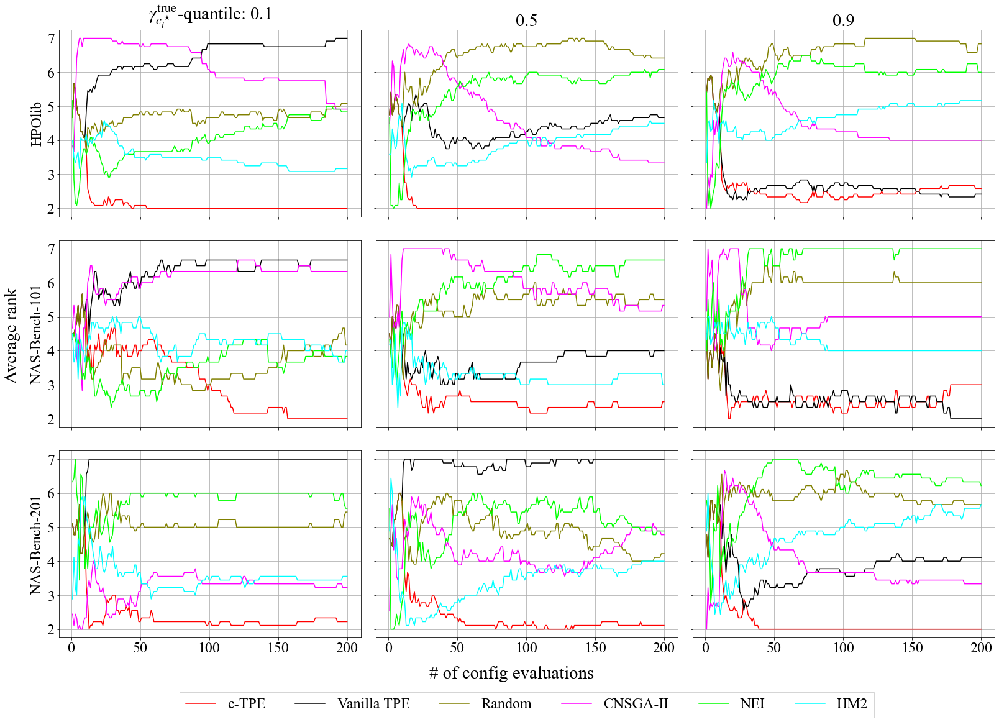

In [3]:
plt.rcParams["font.size"] = 24
max_evals = 200
X = np.arange(max_evals) + 1
opt_names = OPT_NAMES_NO_KA[:]
opt_names = [name for name in opt_names if name != "KA_tpe"]
feasible_domains = [10, 50, 90]
data = {
    bench_name: {domain_size: {name: np.zeros(max_evals) for name in opt_names} for domain_size in feasible_domains}
    for bench_name in BENCH_CHOICES.keys()
}

for bench_name in BENCH_CHOICES.keys():
    choices = BENCH_CHOICES[bench_name]
    n_settings = 0
    for constraint_keys in CONSTRAINT_CHOICES:
        dir_name = get_constraint_directory(constraint_keys)
        for choice in choices:
            if choice == "cifar10C":
                continue

            ec = ExperimentCollector(
                dir_name=dir_name,
                bench_name=bench_name,
                opt_names=opt_names,
                dataset=choice,
                feasible_domains=feasible_domains,
                constraint_keys=modify_constraint_keys(bench_name, constraint_keys),
            )
            rank_dict = ec.compute_rank_over_time()
            n_settings += 1
            for domain_size in feasible_domains:
                for opt_name in opt_names:
                    data[bench_name][domain_size][opt_name] += rank_dict[domain_size][opt_name]
    else:
        for domain_size in feasible_domains:
            for opt_name in opt_names:
                data[bench_name][domain_size][opt_name] /= n_settings

n_rows, n_cols = 3, 3
fig, axes = plt.subplots(
    nrows=n_rows,
    ncols=n_cols,
    sharex=True,
    sharey=True,
    figsize=(27, 18),
    gridspec_kw={
        'wspace': 0.05,
        'hspace': 0.125
    }
)
lines, labels = [], []
r, c = 0, 0
for bench_name in BENCH_CHOICES.keys():
    c = 0
    for domain_size in feasible_domains:
        ax = axes[r][c]
        for opt_name in opt_names:
            label, color = LABEL_DICT[opt_name], COLOR_DICT[opt_name]
            line, = ax.plot(X, data[bench_name][domain_size][opt_name], label=label, color=color)
            if r == 0 and c == 0:
                labels.append(label)
                lines.append(line)

        if r == 0:
            if domain_size == 10:
                ax.set_title(f'{TRUE_GAMMA_STR}-quantile: {domain_size / 100:.1f}', pad=15)
            else:
                ax.set_title(f'{domain_size / 100:.1f}')
        if c == 0:
            ax.set_ylabel(LABEL_DICT[bench_name])

        ax.grid()

        c += 1
    r += 1

axes[-1][1].legend(
    handles=lines,
    labels=labels,
    loc='upper center',
    fontsize=24,
    bbox_to_anchor=(0.5, -0.25),
    fancybox=False,
    shadow=False,
    ncol=len(labels)
)
fig.supxlabel('# of config evaluations', y=0.07)
fig.supylabel('Average rank', x=0.08)
plt.savefig(f'figs/eval-vs-avg-rank-for-each-bench.pdf', bbox_inches='tight')

# Average rank on all the experiments!

HPOlib: Slice Localization
HPOlib: Protein Structure
HPOlib: Naval Propulsion
HPOlib: Parkinsons Telemonitoring
NAS-Bench-101: CIFAR10A
NAS-Bench-101: CIFAR10B
NAS-Bench-201: ImageNet
NAS-Bench-201: CIFAR10
NAS-Bench-201: CIFAR100
HPOlib: Slice Localization
HPOlib: Protein Structure
HPOlib: Naval Propulsion
HPOlib: Parkinsons Telemonitoring
NAS-Bench-101: CIFAR10A
NAS-Bench-101: CIFAR10B
NAS-Bench-201: ImageNet
NAS-Bench-201: CIFAR10
NAS-Bench-201: CIFAR100
HPOlib: Slice Localization
HPOlib: Protein Structure
HPOlib: Naval Propulsion
HPOlib: Parkinsons Telemonitoring
NAS-Bench-101: CIFAR10A
NAS-Bench-101: CIFAR10B
NAS-Bench-201: ImageNet
NAS-Bench-201: CIFAR10
NAS-Bench-201: CIFAR100


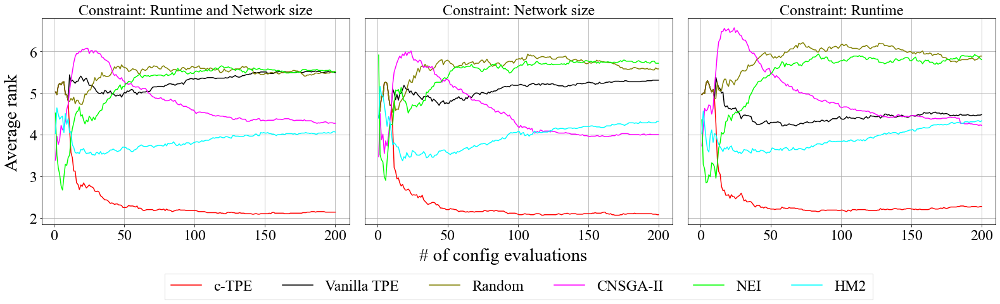

In [4]:
plt.rcParams["font.size"] = 24
max_evals = 200
X = np.arange(max_evals) + 1


def average_rank_dict(rank_dict):
    avg = {}
    opt_names = rank_dict[10].keys()
    domain_sizes = rank_dict.keys()
    for opt_name in opt_names:
        avg[opt_name] = np.mean([rank_dict[s][opt_name] for s in domain_sizes], axis=0)

    return avg
    

fig, axes = plt.subplots(
    nrows=1,
    ncols=3,
    sharex=True,
    sharey=True,
    figsize=(27, 6),
    gridspec_kw={
        'wspace': 0.05,
        'hspace': 0.125
    }
)
index = 0
lines, labels = [], []

for constraint_keys in CONSTRAINT_CHOICES:
    c = index
    ax = axes[index]
    opt_names = get_opt_names(constraint_keys)
    # Remove TPE+KA from opt_names because we do not have it in the main paper
    opt_names = [name for name in opt_names if name != "KA_tpe"]
    index += 1
    rank_dict, counter = get_init_dicts(X, opt_names)

    for bench_name, choices in BENCH_CHOICES.items():
        n_benchs = len(choices)
        constraint_keys = modify_constraint_keys(bench_name, constraint_keys)
        update_by_bench(rank_dict, bench_name, constraint_keys, remove='KA_tpe')

    update_counter(counter, rank_dict)
    avg_rank_dict = average_rank_dict(rank_dict)

    for opt_name, ranks in avg_rank_dict.items():
        color, label = COLOR_DICT[opt_name], LABEL_DICT[opt_name]
        line, = ax.plot(X, ranks, color=color, label=label)

        if c == 0:
            lines.append(line)
            labels.append(label)
 
    if c != 0:
        ax.tick_params(left=False, labelleft=False)

    ax.set_title(f'Constraint: {LABEL_DICT[",".join(constraint_keys)]}', fontsize=24)
    ax.grid()

axes[1].legend(
    handles=lines,
    labels=labels,
    loc='upper center',
    fontsize=24,
    bbox_to_anchor=(0.5, -0.2),
    fancybox=False,
    shadow=False,
    ncol=len(labels)
)
fig.supxlabel('# of config evaluations', y=-0.02)
fig.supylabel('Average rank', x=0.095)
plt.savefig(f'figs/eval-vs-all-avg-rank.pdf', bbox_inches='tight')

# Domain size vs absolute percentage error (new version)

HPOlib: Slice Localization at row=0, col=0
HPOlib: Protein Structure at row=1, col=0
HPOlib: Naval Propulsion at row=2, col=0
HPOlib: Parkinsons Telemonitoring at row=3, col=0
HPOlib: Slice Localization at row=0, col=1
HPOlib: Protein Structure at row=1, col=1
HPOlib: Naval Propulsion at row=2, col=1
HPOlib: Parkinsons Telemonitoring at row=3, col=1
HPOlib: Slice Localization at row=0, col=2
HPOlib: Protein Structure at row=1, col=2
HPOlib: Naval Propulsion at row=2, col=2
HPOlib: Parkinsons Telemonitoring at row=3, col=2
NAS-Bench-101: CIFAR10A at row=0, col=0
NAS-Bench-101: CIFAR10B at row=1, col=0
NAS-Bench-101: CIFAR10C at row=2, col=0
Skip results/runtime,n_params/nasbench101/cifar10C/feasible_010per/cbo
Skip results/runtime,n_params/nasbench101/cifar10C/feasible_010per/hm
Skip results/runtime,n_params/nasbench101/cifar10C/feasible_020per/cbo
Skip results/runtime,n_params/nasbench101/cifar10C/feasible_020per/hm
Skip results/runtime,n_params/nasbench101/cifar10C/feasible_030per/cbo

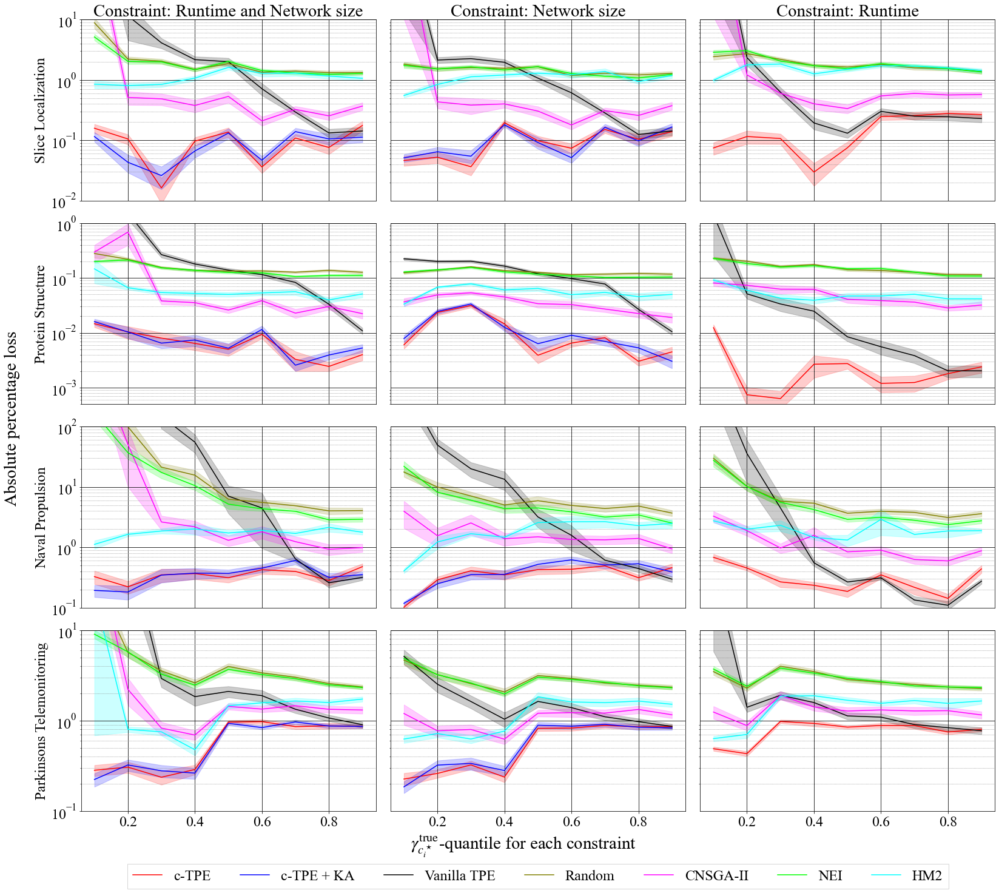

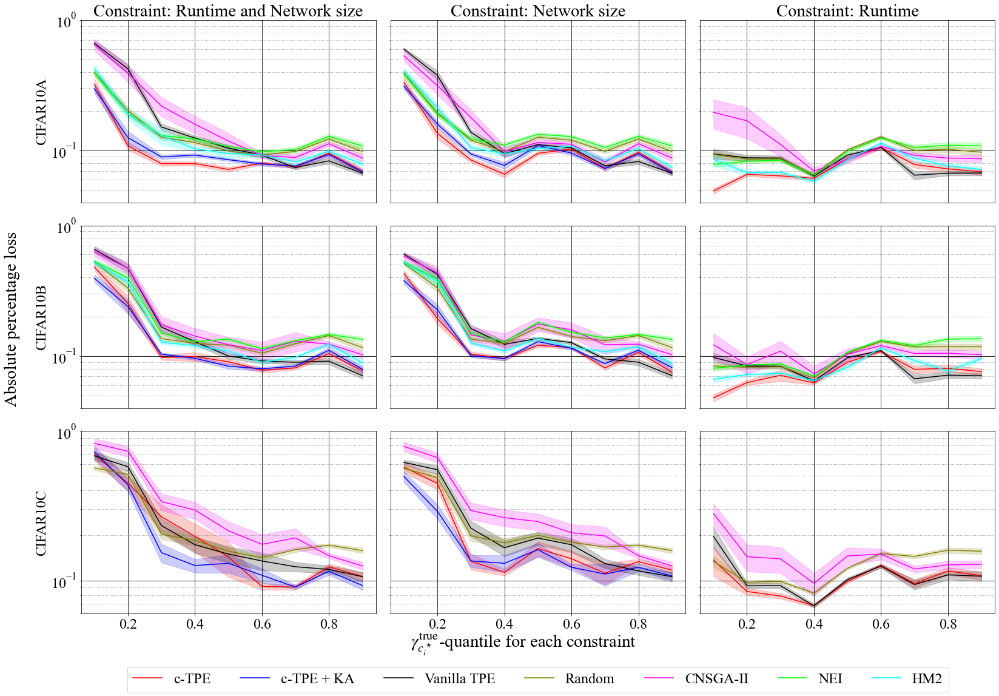

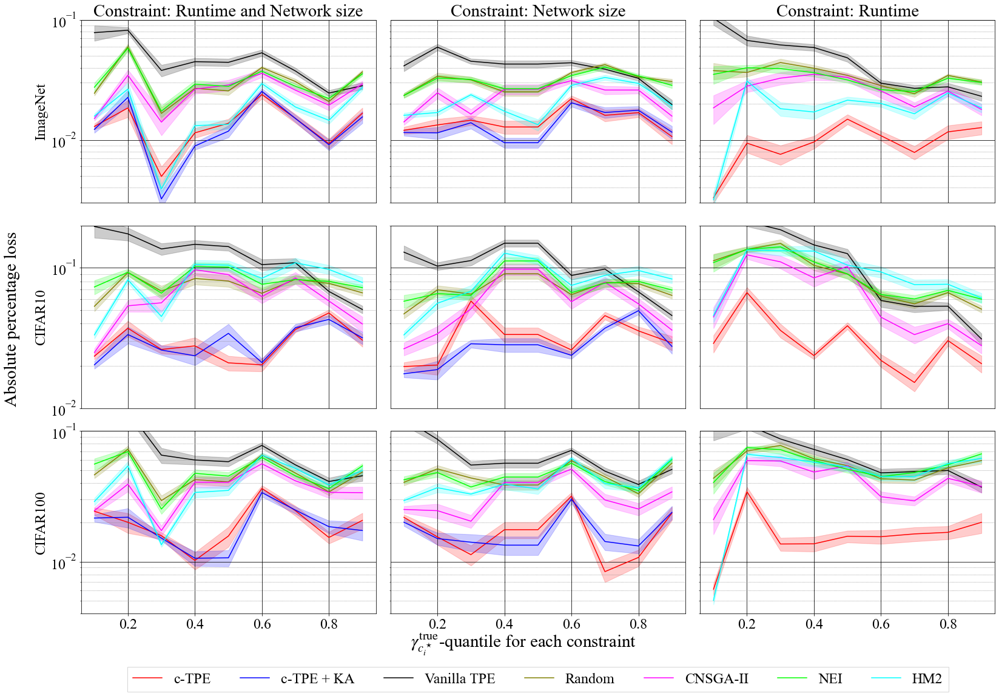

In [5]:
plt.rcParams["font.size"] = 24

end = 200
sqrtN = np.sqrt(50)
margin_dict = {
    'hpolib': (0.06, 0.08),
    'nasbench101': (0.06, 0.07),
    'nasbench201': (0.06, 0.07)
}

ylims = {
    'slice_localization': (1e-2, 1e1),
    'protein_structure': (5e-4, 1e0),
    'naval_propulsion': (1e-1, 1e2),
    'parkinsons_telemonitoring': (1e-1, 1e1),
    'cifar10A': (4e-2, 1),
    'cifar10B': (4e-2, 1),
    'cifar10C': (6e-2, 1),
    'imagenet': (3e-3, 1e-1),
    'cifar10': (1e-2, 2e-1),
    'cifar100': (4e-3, 1e-1),
}

for bench_name, choices in BENCH_CHOICES.items():
    n_benchs = len(choices)
    n_rows, n_cols = n_benchs, 3
    fig, axes = plt.subplots(
        nrows=n_rows,
        ncols=n_cols,
        sharex=True,
        figsize=(27, 6 * n_rows),
        gridspec_kw={
            'wspace': 0.05,
            'hspace': 0.125
        }
    )
    index = 0
    lines, labels = [], []
    quantiles = np.array(DOMAIN_CHOICES) / 100
    for constraint_keys in CONSTRAINT_CHOICES:
        opt_names, dir_name = get_opt_names(constraint_keys), get_constraint_directory(constraint_keys)
        constraint_keys = modify_constraint_keys(bench_name, constraint_keys)

        for choice in choices:
            r, c = index % n_rows, index // n_rows
            print(f'{LABEL_DICT[bench_name]}: {LABEL_DICT[choice]} at row={r}, col={c}')
            ax = axes[r][c]
            index += 1

            dcs = ExperimentCollector(
                dir_name=dir_name,
                bench_name=bench_name,
                opt_names=opt_names,
                dataset=choice,
                constraint_keys=constraint_keys
            ).data_collectors

            for opt_name, color in COLOR_DICT.items():
                label, color = LABEL_DICT[opt_name], COLOR_DICT[opt_name]
                if opt_name not in dcs[DOMAIN_CHOICES[0]].keys():
                    continue

                loss = np.array([dcs[s][opt_name].get_best_absolute_percentage_loss(end=end) for s in DOMAIN_CHOICES])
                mean, ste = loss.mean(axis=-1), loss.std(axis=-1) / sqrtN
                line, = ax.plot(quantiles, mean, label=label, color=color)
                ax.fill_between(quantiles, mean - ste, mean + ste, color=color, alpha=0.2)

                if r == 0 and c == 0:
                    lines.append(line)
                    labels.append(label)

            ax.set_ylim(*ylims[choice])
            ax.set_yscale('log')
            ax.grid(which='minor', color='gray', linestyle=':')
            ax.grid(which='major', color='black')

            if r == 0:
                ax.set_title(f'Constraint: {LABEL_DICT[",".join(constraint_keys)]}')
            if r != n_rows - 1:
                ax.tick_params(bottom=False, labelbottom=False)
            if c == 0:
                ax.set_ylabel(LABEL_DICT[choice])
            else:
                ax.tick_params(left=False, labelleft=False)

    axes[-1][1].legend(
        handles=lines,
        labels=labels,
        loc='upper center',
        fontsize=24,
        bbox_to_anchor=(0.5, -0.25),
        fancybox=False,
        shadow=False,
        ncol=len(labels)
    )
    fig.supxlabel(f'{TRUE_GAMMA_STR}-quantile for each constraint', y=margin_dict[bench_name][1])
    fig.supylabel('Absolute percentage loss', x=margin_dict[bench_name][0])
    plt.savefig(f'figs/percentile-vs-percentage-error-{bench_name}.pdf', bbox_inches='tight')

# Performance over time for domain size of 10, 50, 90% on Naval Propulsion, CIFAR10C, ImageNet (network size + runtime)

HPOlib: Slice Localization
NAS-Bench-101: CIFAR10A
NAS-Bench-201: ImageNet


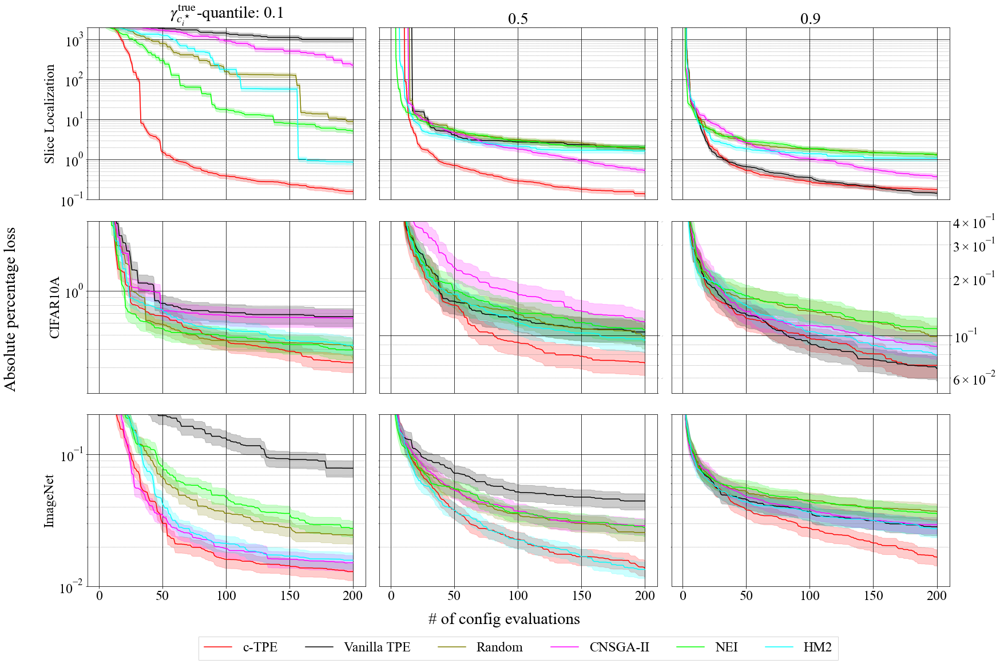

In [6]:
for constraint_keys in [['runtime', 'n_params']]:
    # This is for the results in the main part, so we remove KA. 
    opt_names = OPT_NAMES_NO_KA[:]
    dir_name = get_constraint_directory(constraint_keys)
    suffix = '-and-'.join(constraint_keys)
    X = np.arange(200) + 1
    plt.rcParams["font.size"] = 24
    choices = {
        'hpolib': 'slice_localization',
        'nasbench101': 'cifar10A',
        'nasbench201': 'imagenet'
    }

    n_rows, n_cols = 3, 3
    fig, axes = plt.subplots(
        nrows=n_rows,
        ncols=n_cols,
        figsize=(27, 18),
        gridspec_kw={
            'wspace': 0.05,
            'hspace': 0.125
        }
    )
    # ylims = [(1e0, 1e4), (5e-2, 2e0), (1e-2, 2e-1)]
    ylims = [(1e-1, 2e3), (5e-2, 2e0), (1e-2, 2e-1)]
    index = 0
    sqrtN = np.sqrt(50)
    labels, lines = [], []

    for bench_name in ['hpolib', 'nasbench101', 'nasbench201']:
        choice = choices[bench_name]

        if bench_name == 'nasbench201' and 'n_params' in constraint_keys:
            constraint_keys = [k if k != 'n_params' else 'size_in_mb' for k in constraint_keys]

        print(f'{LABEL_DICT[bench_name]}: {LABEL_DICT[choice]}')
        ec = ExperimentCollector(
            dir_name=dir_name,
            opt_names=opt_names,
            bench_name=bench_name,
            dataset=choice,
            feasible_domains=[10, 50, 90],
            constraint_keys=constraint_keys
        )

        for domain_size, dcs in ec.data_collectors.items():
            r, c = index // n_cols, index % n_cols
            ax = axes[r][c]
            index += 1
            for opt_name, dc in dcs.items():
                loss = dc.get_cum_absolute_percentage_loss()
                mean = loss.mean(axis=0)
                ste = loss.mean(axis=0) / sqrtN
                line, = ax.plot(X, mean, label=LABEL_DICT[opt_name], color=COLOR_DICT[opt_name])
                if r == 0 and c == 0:
                    lines.append(line)
                    labels.append(LABEL_DICT[opt_name])

                ax.fill_between(X, mean - ste, mean + ste, alpha=0.2, color=COLOR_DICT[opt_name])

            if r == 0:
                if domain_size == 10:
                    ax.set_title(f'{TRUE_GAMMA_STR}-quantile: {domain_size / 100:.1f}', pad=15)
                else:
                    ax.set_title(f'{domain_size / 100:.1f}')                

            if r != n_rows - 1:
                ax.tick_params(bottom=False, labelbottom=False)
            if c == 0:
                ax.set_ylabel(f'{LABEL_DICT[choice]}')
            elif bench_name != 'nasbench101':
                ax.tick_params(left=False, labelleft=False)
            elif c == 1:
                ax.yaxis.tick_right()
                # Since tick labels do not disappear, force the fontsize to be very small.
                ax.tick_params(axis='y', which='major', labelsize=1)
                ax.tick_params(axis='y', which='minor', labelsize=1)
            else:
                ax.yaxis.tick_right()

            if bench_name != 'nasbench101':
                ax.set_ylim(*ylims[r])
            elif c == 0:
                ax.set_ylim(2e-1, 3e0)
            else:
                ax.set_ylim(5e-2, 4e-1)

            ax.set_yscale('log')
            ax.grid(which='minor', color='gray', linestyle=':')
            ax.grid(which='major', color='black')

    axes[-1][1].legend(
        handles=lines,
        labels=labels,
        loc='upper center',
        fontsize=24,
        bbox_to_anchor=(0.5, -0.25),
        fancybox=False,
        shadow=False,
        ncol=len(labels)
    )
    fig.supxlabel('# of config evaluations', y=0.07)
    fig.supylabel('Absolute percentage loss', x=0.05)
    plt.savefig(f'figs/eval-vs-loss-{suffix}-abst.pdf', bbox_inches='tight')

# Performance over time for domain size of 10, 50, 90% on all the datasets for all the constraints

HPOlib: Slice Localization
HPOlib: Protein Structure
HPOlib: Naval Propulsion
HPOlib: Parkinsons Telemonitoring
NAS-Bench-101: CIFAR10A
NAS-Bench-101: CIFAR10B
NAS-Bench-101: CIFAR10C
Skip results/runtime,n_params/nasbench101/cifar10C/feasible_010per/cbo
Skip results/runtime,n_params/nasbench101/cifar10C/feasible_010per/hm
Skip results/runtime,n_params/nasbench101/cifar10C/feasible_050per/cbo
Skip results/runtime,n_params/nasbench101/cifar10C/feasible_050per/hm
Skip results/runtime,n_params/nasbench101/cifar10C/feasible_090per/cbo
Skip results/runtime,n_params/nasbench101/cifar10C/feasible_090per/hm
NAS-Bench-201: ImageNet
NAS-Bench-201: CIFAR10
NAS-Bench-201: CIFAR100
HPOlib: Slice Localization
HPOlib: Protein Structure
HPOlib: Naval Propulsion
HPOlib: Parkinsons Telemonitoring
NAS-Bench-101: CIFAR10A
NAS-Bench-101: CIFAR10B
NAS-Bench-101: CIFAR10C
Skip results/n_params/nasbench101/cifar10C/feasible_010per/cbo
Skip results/n_params/nasbench101/cifar10C/feasible_010per/hm
Skip results/

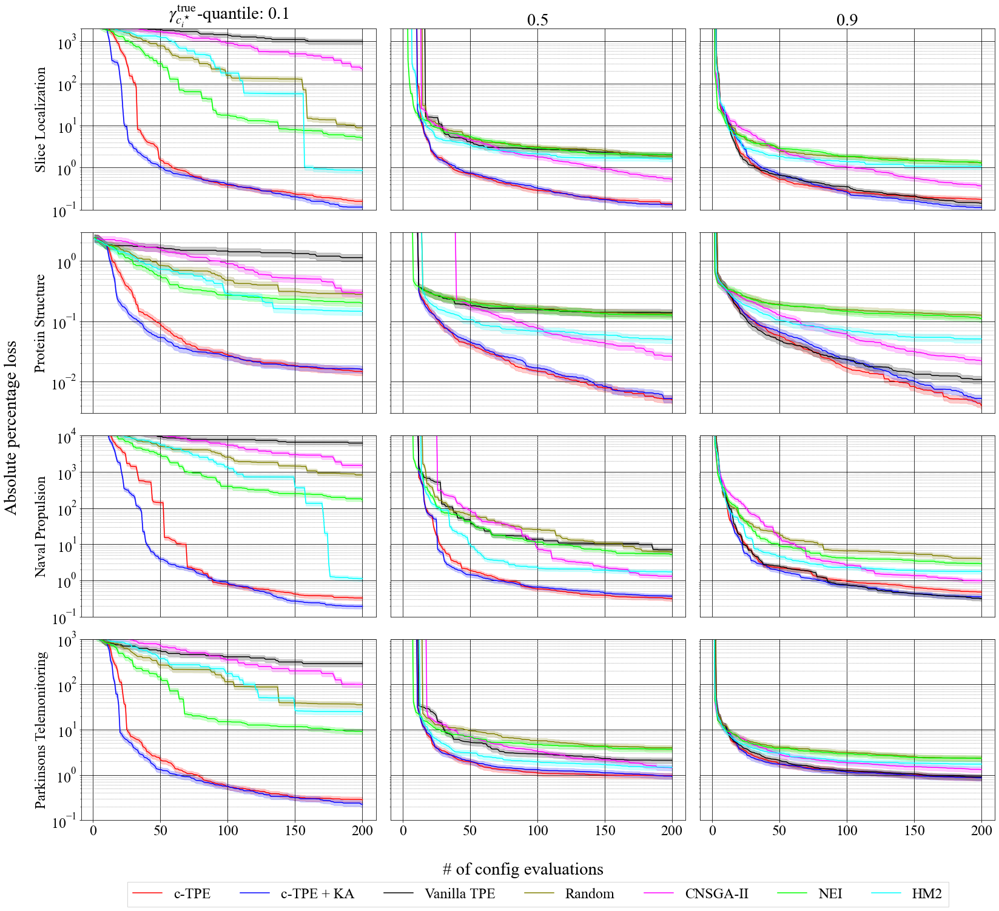

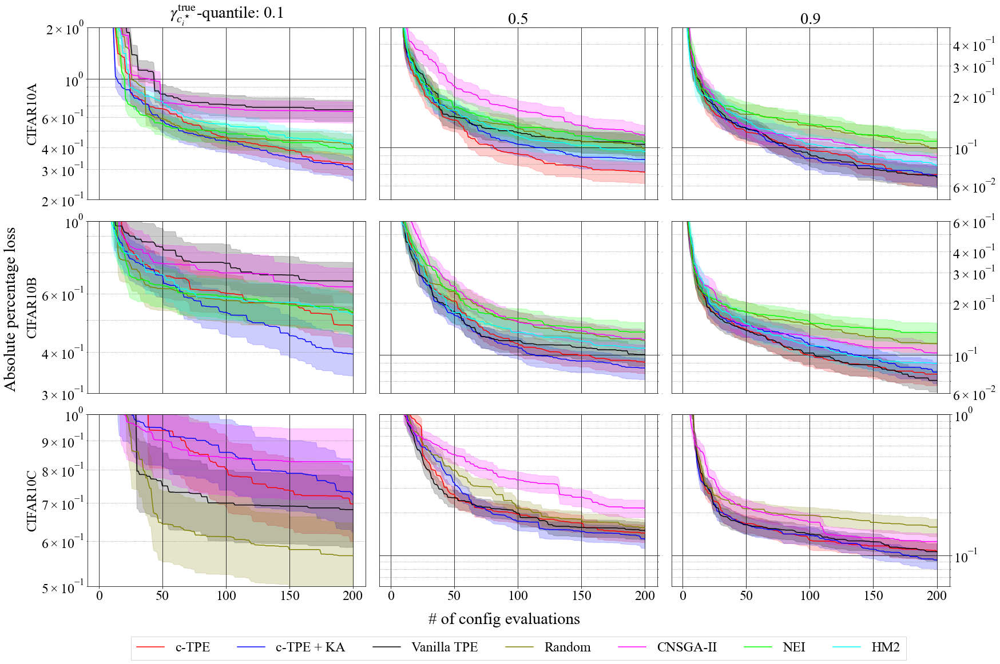

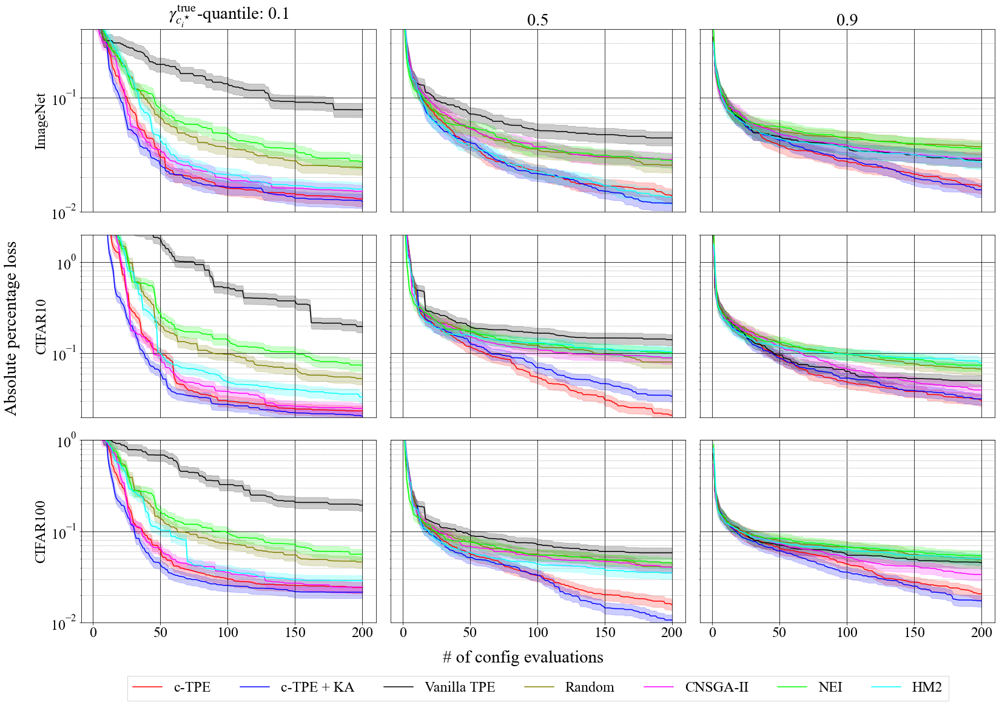

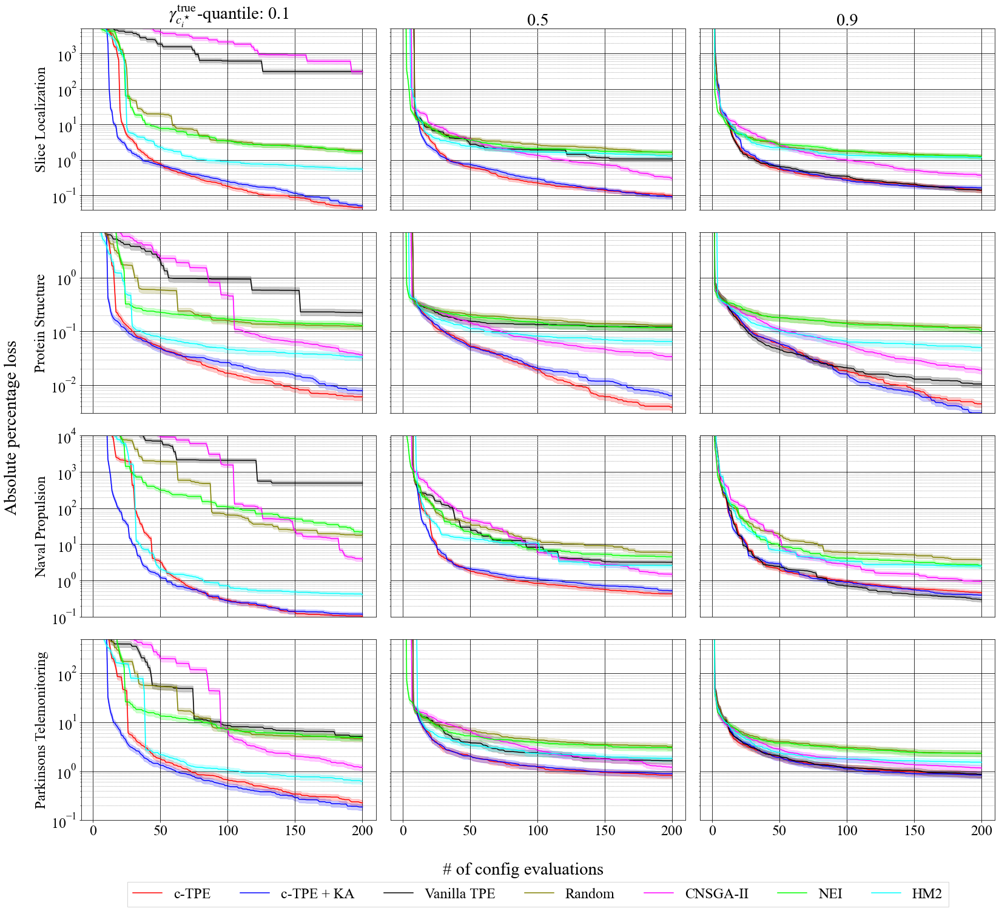

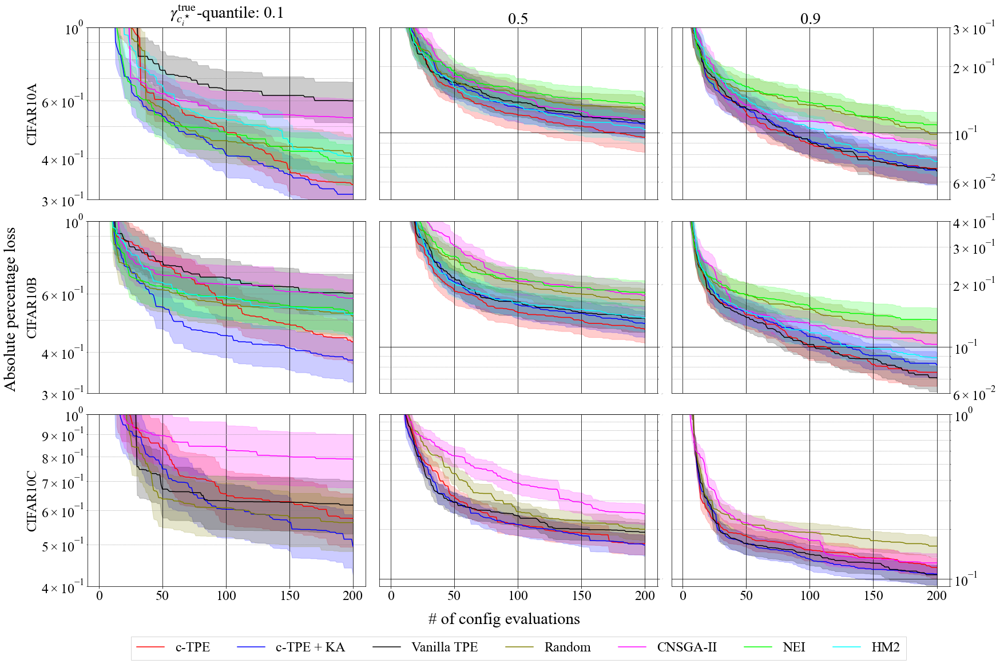

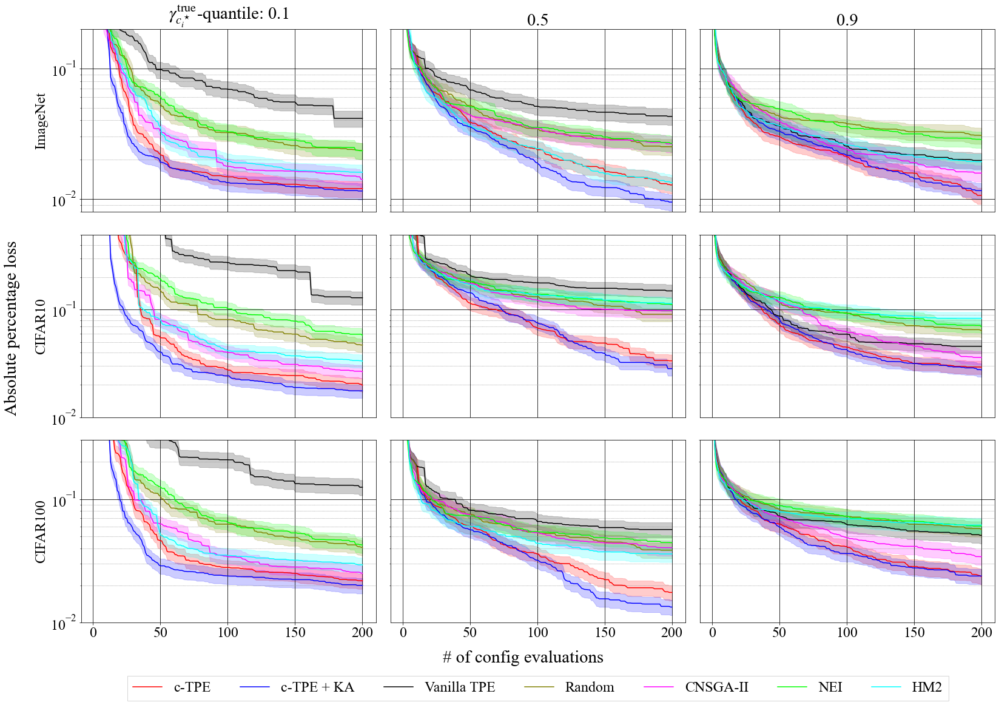

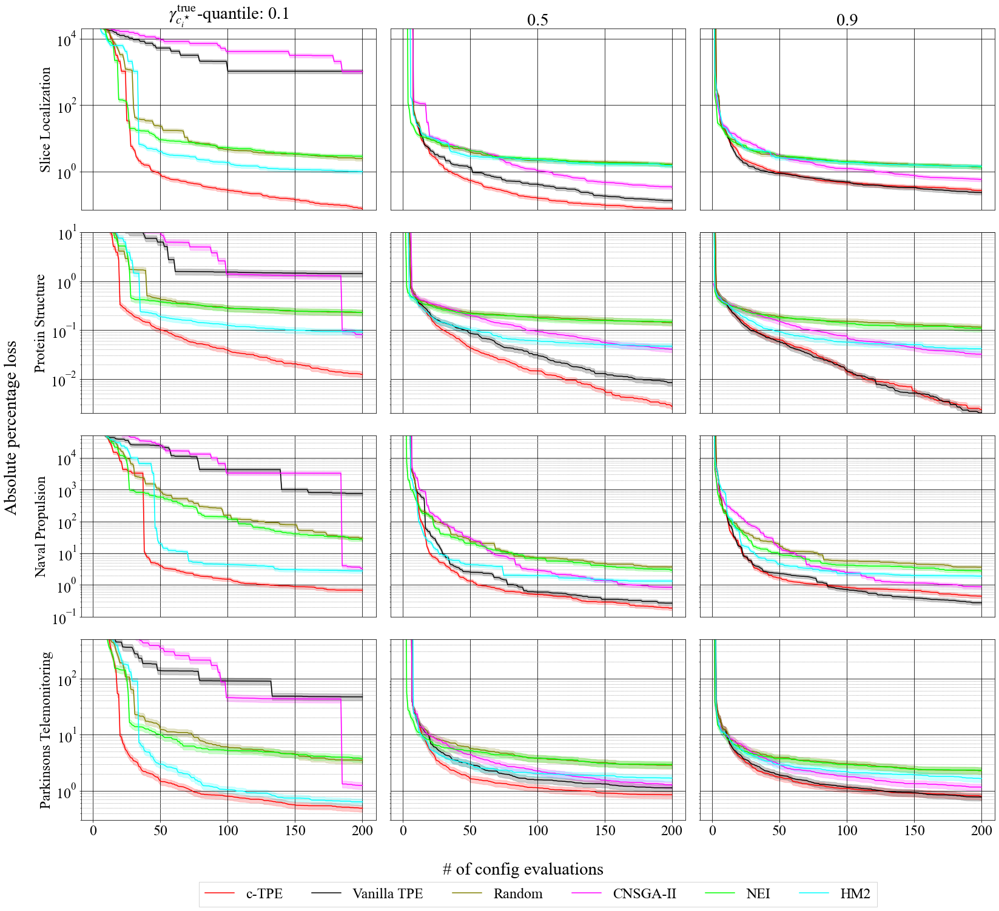

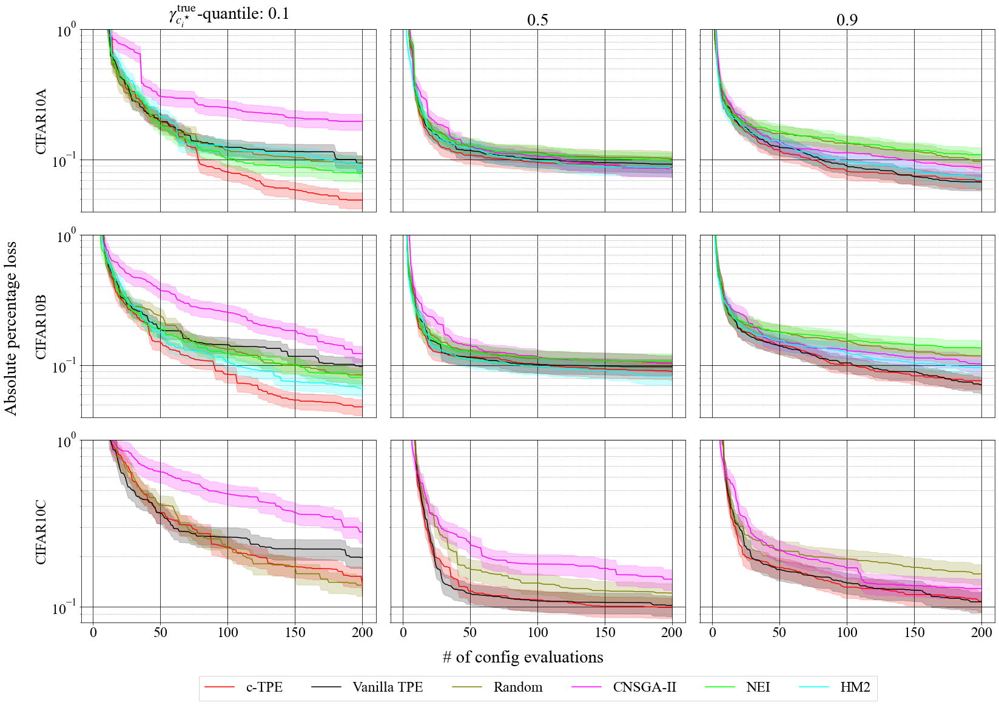

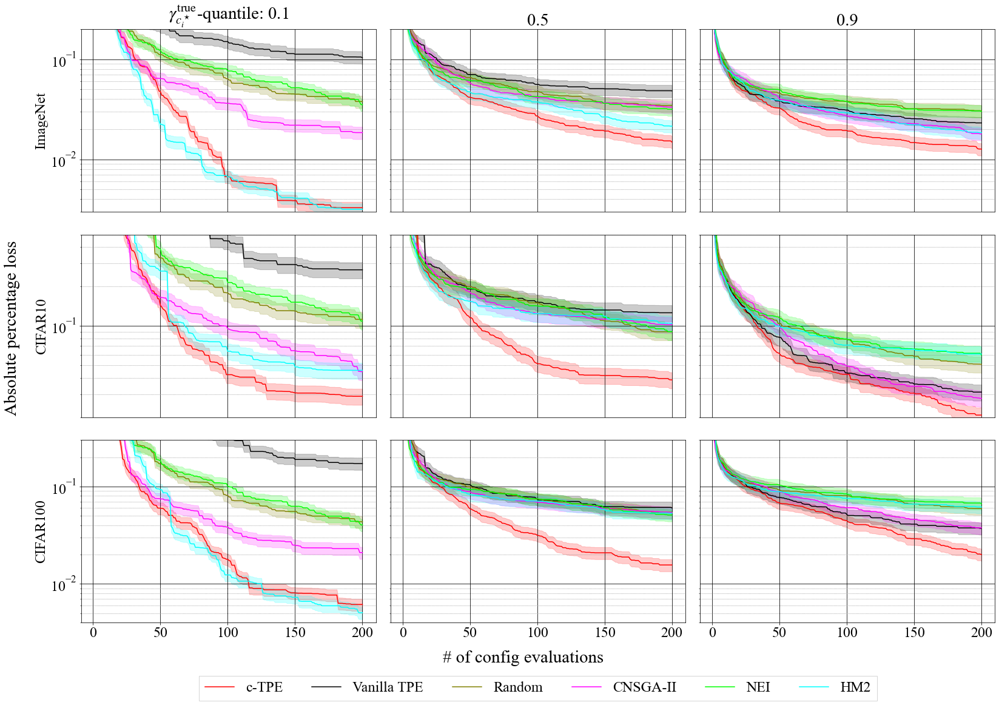

In [7]:
ylims_dict = {
    'runtime,n_params': {
        'hpolib': {
            'slice_localization': (1e-1, 2e3),
            'protein_structure': (3e-3, 3),
            'naval_propulsion': (1e-1, 1e4),
            'parkinsons_telemonitoring': (1e-1, 1e3)
        },
        'nasbench101': {
            'cifar10A': [(2e-1, 2), (5e-2, 0.5)],
            'cifar10B': [(3e-1, 1), (6e-2, 0.6)],
            'cifar10C': [(5e-1, 1), (6e-2, 1)],
        },
        'nasbench201': {
            'imagenet': (1e-2, 4e-1),
            'cifar10': (2e-2, 2),
            'cifar100': (1e-2, 1),
        }
    },
    'runtime': {
        'hpolib': {
            'slice_localization': (7e-2, 2e4),
            'protein_structure': (2e-3, 1e1),
            'naval_propulsion': (1e-1, 5e4),
            'parkinsons_telemonitoring': (3e-1, 5e2)
        },
        'nasbench101': {
            'cifar10A': (4e-2, 1),
            'cifar10B': (4e-2, 1),
            'cifar10C': (8e-2, 1),
        },
        'nasbench201': {
            'imagenet': (3e-3, 2e-1),
            'cifar10': (2e-2, 5e-1),
            'cifar100': (4e-3, 3e-1),
        }
    },
    'n_params': {
        'hpolib': {
            'slice_localization': (4e-2, 5e3),
            'protein_structure': (3e-3, 7),
            'naval_propulsion': (1e-1, 1e4),
            'parkinsons_telemonitoring': (1e-1, 5e2)
        },
        'nasbench101': {
            'cifar10A': [(3e-1, 1), (5e-2, 0.3)],
            'cifar10B': [(3e-1, 1), (6e-2, 0.4)],
            'cifar10C': [(4e-1, 1), (9e-2, 1)],
        },
        'nasbench201': {
            'imagenet': (8e-3, 2e-1),
            'cifar10': (1e-2, 5e-1),
            'cifar100': (1e-2, 3e-1),
        }
    }
}

for constraint_keys in [['runtime', 'n_params'], ['n_params'], ['runtime']]:
    opt_names = OPT_NAMES_NO_KA[:] if constraint_keys == ['runtime'] else OPT_NAMES[:]
    dir_name = get_constraint_directory(constraint_keys)
    suffix = '-and-'.join(constraint_keys)
    X = np.arange(200) + 1
    plt.rcParams["font.size"] = 24

    ylims = ylims_dict[",".join(constraint_keys)]
    sqrtN = np.sqrt(50)

    for bench_name in ['hpolib', 'nasbench101', 'nasbench201']:
        choices = BENCH_CHOICES[bench_name]
        n_benchs = len(choices)
        n_rows, n_cols = n_benchs, 3
        fig, axes = plt.subplots(
            nrows=n_rows,
            ncols=n_cols,
            sharex=True,
            figsize=(27, 6 * n_rows),
            gridspec_kw={
                'wspace': 0.05,
                'hspace': 0.125
            }
        )
        index = 0
        lines, labels = [], []

        if bench_name == 'nasbench201' and 'n_params' in constraint_keys:
            constraint_keys = [k if k != 'n_params' else 'size_in_mb' for k in constraint_keys]

        for choice in choices:
            print(f'{LABEL_DICT[bench_name]}: {LABEL_DICT[choice]}')
            ec = ExperimentCollector(
                dir_name=dir_name,
                bench_name=bench_name,
                opt_names=opt_names,
                dataset=choice,
                feasible_domains=[10, 50, 90],
                constraint_keys=constraint_keys
            )

            for domain_size, dcs in ec.data_collectors.items():
                r, c = index // n_cols, index % n_cols
                ax = axes[r][c]
                index += 1
                for opt_name, dc in dcs.items():
                    loss = dc.get_cum_absolute_percentage_loss()
                    mean = loss.mean(axis=0)
                    ste = loss.mean(axis=0) / sqrtN
                    
                    line, = ax.plot(X, mean, label=LABEL_DICT[opt_name], color=COLOR_DICT[opt_name])
                    if r == 0 and c == 0:
                        lines.append(line)
                        labels.append(LABEL_DICT[opt_name])

                    ax.fill_between(X, mean - ste, mean + ste, alpha=0.2, color=COLOR_DICT[opt_name])

                if r == 0:
                    if domain_size == 10:
                        ax.set_title(f'{TRUE_GAMMA_STR}-quantile: {domain_size / 100:.1f}', pad=15)
                    else:
                        ax.set_title(f'{domain_size / 100:.1f}')

                if r != n_rows - 1:
                    ax.tick_params(bottom=False, labelbottom=False)
                if c == 0:
                    ax.set_ylabel(f'{LABEL_DICT[choice]}')
                elif bench_name != 'nasbench101' or suffix == 'runtime':
                    ax.tick_params(left=False, labelleft=False)
                elif c == 1:
                    ax.yaxis.tick_right()
                    # Since tick labels do not disappear, force the fontsize to be very small.
                    ax.tick_params(axis='y', which='major', labelsize=1)
                    ax.tick_params(axis='y', which='minor', labelsize=1)
                else:
                    ax.yaxis.tick_right()

                if bench_name != 'nasbench101' or suffix == 'runtime':
                    ax.set_ylim(*ylims[bench_name][choice])
                else:
                    ax.set_ylim(*ylims[bench_name][choice][c != 0])

                ax.set_yscale('log')
                ax.grid(which='minor', color='gray', linestyle=':')
                ax.grid(which='major', color='black')

        axes[-1][1].legend(
            handles=lines,
            labels=labels,
            loc='upper center',
            fontsize=24,
            bbox_to_anchor=(0.5, -0.25 - 0.05 * (len(choices) == 4)),
            fancybox=False,
            shadow=False,
            ncol=len(labels)
        )
        fig.supxlabel('# of config evaluations', y=0.07)
        fig.supylabel('Absolute percentage loss', x=0.06 if bench_name != 'nasbench101' or suffix == 'runtime' else 0.05)
        plt.savefig(f'figs/eval-vs-loss-{bench_name}-{suffix}.pdf', bbox_inches='tight')

# Number of violations over time

HPOlib: Slice Localization
HPOlib: Protein Structure
HPOlib: Naval Propulsion
HPOlib: Parkinsons Telemonitoring
NAS-Bench-101: CIFAR10A
NAS-Bench-101: CIFAR10B
NAS-Bench-101: CIFAR10C
NAS-Bench-201: ImageNet
NAS-Bench-201: CIFAR10
NAS-Bench-201: CIFAR100


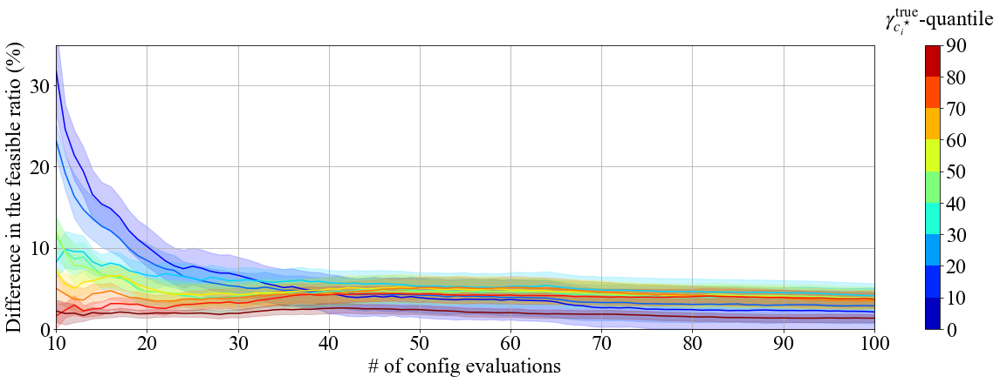

In [8]:
constraint_keys = CONSTRAINT_CHOICES[1]
opt_names = OPT_NAMES_NO_KA[:] if constraint_keys == ['runtime'] else OPT_NAMES[:]
dir_name = get_constraint_directory(constraint_keys)

window_size = 1
size, start = 100, 10
X = np.arange(size) + start
n_max_violations = np.arange(size) + 1
plt.rcParams["font.size"] = 24

results = {
    domain_size: {opt_name: np.zeros((10, size), dtype=np.float32) for opt_name in ['tpe', 'KA_tpe']}
    for domain_size in range(10, 100, 10)
}
index = 0
plt.rcParams["font.size"] = 24
cm = plt.get_cmap('jet')

fig, ax = plt.subplots(
    nrows=1,
    ncols=1,
    figsize=(21, 6),
    gridspec_kw={
        'wspace': 0.05,
        'hspace': 0.125
    }
)


for bench_name in ['hpolib', 'nasbench101', 'nasbench201']:
    choices = BENCH_CHOICES[bench_name]
    n_benchs = len(choices)

    if bench_name == 'nasbench201' and 'n_params' in constraint_keys:
        constraint_keys = [k if k != 'n_params' else 'size_in_mb' for k in constraint_keys]

    for choice in choices:
        print(f'{LABEL_DICT[bench_name]}: {LABEL_DICT[choice]}')

        ec = ExperimentCollector(
            dir_name=dir_name,
            bench_name=bench_name,
            dataset=choice,
            opt_names=['tpe', 'KA_tpe'],
            constraint_keys=constraint_keys
        )
        stats = ec.get_is_satisfied_moving_average(window_size=window_size)
        
        for domain_size in range(10, 100, 10):
            opt_name = 'tpe'
            mean, _ = stats[domain_size][opt_name]
            results[domain_size][opt_name][index] += mean[start:start+size]

            opt_name = 'KA_tpe'
            mean, _ = stats[domain_size][opt_name]
            results[domain_size][opt_name][index] += mean[start:start+size]
        
        index += 1

sqrtN = np.sqrt(index)
for domain_size in range(10, 100, 10):
    diff = 100.0 * (results[domain_size]['KA_tpe'] - results[domain_size]['tpe']) / n_max_violations
    mean = np.mean(diff, axis=0)
    ste = np.std(diff, axis=0) / sqrtN

    ax.plot(X, mean, color=cm(domain_size / 90))
    ax.fill_between(X, mean - ste, mean + ste, color=cm(domain_size / 90), alpha=0.2)

zeros = [[0, 0], [0, 0]]
levels = np.linspace(0, 90, 10)
contour = plt.contourf(zeros, zeros, zeros, cmap=cm, levels=levels)
cbar = fig.colorbar(contour)
cbar.ax.set_title(f'{TRUE_GAMMA_STR}-quantile', size=24, x=1, y=1.05)
ax.set_xlim(10, size)
ax.set_ylim(0, 35)
ax.set_xlabel('# of config evaluations')
ax.set_ylabel('Difference in the feasible ratio (%)')
ax.grid()

plt.savefig(f'figs/violation-over-time-n_params.pdf', bbox_inches='tight')

## Algorithm intuition for the objective split

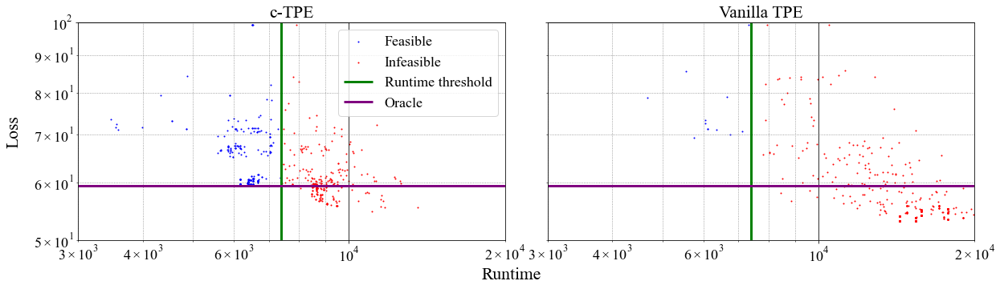

In [10]:
cstr = 'runtime'
ec = ExperimentCollector(
    dir_name=f'results/{cstr}',
    bench_name='nasbench201',
    opt_names=['tpe', 'vanilla_tpe'],
    dataset='imagenet',
    feasible_domains=[10],
    constraint_keys=[cstr]
)

plt.rcParams["font.size"] = 18
n_seeds, start, end, s = 5, 100, 200, 1

fig, axes = plt.subplots(
    ncols=2,
    figsize=(20, 5),
    sharex=True,
    sharey=True,
    gridspec_kw={
        'wspace': 0.1,
        'hspace': 0.125
    }
)
threshold, oracle = ec.data_collectors[10]['tpe'].constraints[cstr], ec.data_collectors[10]['tpe'].oracle

for r, (opt_name, ax) in enumerate(zip(['tpe', 'vanilla_tpe'], axes)):
    cstr_vals = ec.data_collectors[10][opt_name].cstr_vals[cstr][:n_seeds, start:end].flatten()
    loss = ec.data_collectors[10][opt_name].loss[:n_seeds, start:end].flatten()

    ok = cstr_vals <= threshold
    ax.scatter(cstr_vals[ok], loss[ok], s=s, color='blue', label='Feasible')
    ax.scatter(cstr_vals[~ok], loss[~ok], s=s, color='red', label='Infeasible')

    ax.set_title(LABEL_DICT[opt_name])
    ax.vlines(threshold, 50, 100, color='green', label='Runtime threshold', lw=3)
    ax.hlines(oracle, 3e3, 2e4, color='purple', label='Oracle', lw=3)
    ax.set_xscale('log')
    ax.set_xlim(3e3, 2e4)
    ax.set_ylim(50, 100)
    ax.set_yscale('log')
    ax.grid(which='minor', color='gray', linestyle=':')
    ax.grid(which='major', color='black')

    if r == 0:
        ax.legend()

fig.supxlabel('Runtime', y=-0.025)
fig.supylabel('Loss', x=0.0625)

plt.savefig(f'figs/too-greedy-for-objective-imagenet.pdf', bbox_inches='tight')

## Wilcoxon test for the main part

In [11]:
from scipy.stats import wilcoxon

"""
The Wilcoxon signed-rank test
https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.wilcoxon.html

Dataset 9 x Constraints 3 x quantile 9

1. Test for fixed quantiles (0.1, 0.5, 0.9) over constraints and datasets
2. Test for fixed constraints over datasets and quantiles

Format
col 02 -- 05: category 1 with n_evals=50~200
col 06 -- 09: category 2 with n_evals=50~200
col 10 -- 13: category 3 with n_evals=50~200
Each value is a p-value for the corresponding task.
Make p-value bold if p-value is smaller than 0.01 and omit the precision if p-value is smaller than 1e-10.

opt_name & \textbf{1.1e-1} & \textbf{1.1e-1} & \textbf{1.1e-1} & \textbf{1.1e-1} &
           \textbf{1.1e-1} & \textbf{1.1e-1} & \textbf{1.1e-1} & \textbf{1.1e-1} &
           \textbf{1.1e-1} & \textbf{1.1e-1} & \textbf{1.1e-1} & \textbf{1.1e-1} \\
"""

def data_extractor(dir_name, bench_name, opt_names, constraint_keys, dataset, n_evals_set=[49, 99, 149, 199]):
    dc = ExperimentCollector(
        dir_name=dir_name,
        bench_name=bench_name,
        opt_names=opt_names,
        dataset=dataset,
        constraint_keys=constraint_keys
    ).data_collectors
    _data = {}
    for domain_size in dc.keys():
        _data[domain_size] = {}
        for opt_name in dc[domain_size].keys():
            dc[domain_size][opt_name].compute_cum_loss()
            loss = dc[domain_size][opt_name].cum_loss[:, n_evals_set]
            _data[domain_size][opt_name] = np.median(loss, axis=0)
    
    return _data



def group_by_quantiles(data, opt_name, quantiles=[10, 50, 90]):
    _data = {domain_size: [] for domain_size in quantiles}
    for constraint in data.keys():
        d1 = data[constraint]
        for dataset in d1.keys():
            d2 = d1[dataset]
            for domain_size in quantiles:
                _data[domain_size].append(d2[domain_size][opt_name])
    
    return {k: np.array(v) for k, v in _data.items()}


def group_by_constraints(data, opt_name):
    _data = {constraint: [] for constraint in data.keys()}
    for constraint in data.keys():
        d1 = data[constraint]
        for dataset in d1.keys():
            d2 = d1[dataset]
            for d3 in d2.values():
                _data[constraint].append(d3[opt_name])

    return {k: np.array(v) for k, v in _data.items()}


def get_data(opt_names, remove_constraint=None):
    data = {}
    for constraint_keys in CONSTRAINT_CHOICES:
        dir_name = get_constraint_directory(constraint_keys)
        tag = get_constraint_tag(constraint_keys)
        if remove_constraint is not None and tag in remove_constraint:
            continue
            
        data[tag] = {}

        for bench_name, choices in BENCH_CHOICES.items():
            for choice in choices:
                if choice == 'cifar10C':
                    continue

                print(f'{LABEL_DICT[bench_name]}: {LABEL_DICT[choice]}')
                if bench_name == 'nasbench201' and 'n_params' in constraint_keys:
                    constraint_keys = [k if k != 'n_params' else 'size_in_mb' for k in constraint_keys]

                data[tag][choice] = data_extractor(dir_name, bench_name, opt_names, constraint_keys, choice)
    return data


data = get_data(opt_names=OPT_NAMES_NO_KA[:])
for group_by_func in [group_by_constraints, group_by_quantiles]:
    data4tpe = group_by_func(data, 'tpe')
    print('\n' * 2)  # Make new lines
    print('\\begin{table*}[t]')
    print('\\begin{center}')
    print('\\caption{}')
    print('\\label{tab:}')
    print('\\begin{tabular}{lcccc|cccc|cccc}')
    print('\\toprule')
    print('\\multicolumn{1}{c}{xxxxx}')
    for cat in data4tpe.keys():
        print(f'& \\multicolumn{{4}}{{c}}{"{" + str(LABEL_DICT.get(cat, cat)) + "}"}')

    print('\\\\')
    print('\\multicolumn{1}{c}{Methods / \\# of configs}')
    print('& 50 & 100 & 150 & 200 ' * 3)
    print('\\\\')
    print('\\midrule')

    for opt_name in OPT_NAMES_NO_KA:
        if opt_name == 'tpe':
            continue

        data4cmp = group_by_func(data, opt_name)
        output = [LABEL_DICT[opt_name]]
        for cat in data4tpe.keys():
            for idx, n_evals in enumerate([50, 100, 150, 200]):
                p_value = wilcoxon(data4tpe[cat][:, idx], data4cmp[cat][:, idx], alternative='less').pvalue
                wins = data4tpe[cat][:, idx] < data4cmp[cat][:, idx]
                ties = data4tpe[cat][:, idx] == data4cmp[cat][:, idx]
                win, tie = wins.sum(), ties.sum()
                lose = wins.size - win - tie

                if p_value < 1e-2:
                    res = f"\\textbf{'{' + f'{win}/{lose}/{tie}' + '}'}"
                else:
                    res = f"{win}/{lose}/{tie}"

                output.append(f' & {res}')

        output.append('\\\\')
        print("".join(output))

    print("\\bottomrule")
    print("\\end{tabular}")
    print("\\end{center}")
    print("\\end{table*}")

HPOlib: Slice Localization
HPOlib: Protein Structure
HPOlib: Naval Propulsion
HPOlib: Parkinsons Telemonitoring
NAS-Bench-101: CIFAR10A
NAS-Bench-101: CIFAR10B
NAS-Bench-201: ImageNet
NAS-Bench-201: CIFAR10
NAS-Bench-201: CIFAR100
HPOlib: Slice Localization
HPOlib: Protein Structure
HPOlib: Naval Propulsion
HPOlib: Parkinsons Telemonitoring
NAS-Bench-101: CIFAR10A
NAS-Bench-101: CIFAR10B
NAS-Bench-201: ImageNet
NAS-Bench-201: CIFAR10
NAS-Bench-201: CIFAR100
HPOlib: Slice Localization
HPOlib: Protein Structure
HPOlib: Naval Propulsion
HPOlib: Parkinsons Telemonitoring
NAS-Bench-101: CIFAR10A
NAS-Bench-101: CIFAR10B
NAS-Bench-201: ImageNet
NAS-Bench-201: CIFAR10
NAS-Bench-201: CIFAR100



\begin{table*}[t]
\begin{center}
\caption{}
\label{tab:}
\begin{tabular}{lcccc|cccc|cccc}
\toprule
\multicolumn{1}{c}{xxxxx}
& \multicolumn{4}{c}{Runtime and Network size}
& \multicolumn{4}{c}{Network size}
& \multicolumn{4}{c}{Runtime}
\\
\multicolumn{1}{c}{Methods / \# of configs}
& 50 & 100 & 150 & 2

## Wilcoxon test for the Knowledge augmentation

In [12]:
data = get_data(opt_names=['tpe', 'KA_tpe'], remove_constraint='runtime')

data4tpe = group_by_quantiles(data, 'tpe')
data4KA = group_by_quantiles(data, 'KA_tpe')
    
print('\n' * 2)  # Make new lines
print('\\begin{table*}[t]')
print('\\begin{center}')
print('\\caption{}')
print('\\label{suppl:tab:KA-test}')
print('\\begin{tabular}{lcccc|cccc|cccc}')
print('\\toprule')
print('\\multicolumn{1}{c}{$\\truegamma$}')
for cat in [0.1, 0.5, 0.9]:
    print(f'& \\multicolumn{{4}}{{c}}{"{$" + str(cat) + "$}"}')

print('\\\\')
print('\\multicolumn{1}{c}{\\# of configs}')
print('& 50 & 100 & 150 & 200 ' * 3)
print('\\\\')
print('\\midrule')

output = ['Wins/Loses/Ties']
for cat in data4tpe.keys():
    for idx, n_evals in enumerate([50, 100, 150, 200]):
        p_value = wilcoxon(data4KA[cat][:, idx], data4tpe[cat][:, idx], alternative='less').pvalue
        wins = data4KA[cat][:, idx] < data4tpe[cat][:, idx]
        ties = data4KA[cat][:, idx] == data4tpe[cat][:, idx]
        win, tie = wins.sum(), ties.sum()
        lose = wins.size - win - tie

        if p_value < 5e-2:
            res = f"\\textbf{'{' + f'{win}/{lose}/{tie}' + '}'}"
        else:
            res = f"{win}/{lose}/{tie}"

        output.append(f' & {res}')

output.append('\\\\')
print("".join(output))

print("\\bottomrule")
print("\\end{tabular}")
print("\\end{center}")
print("\\end{table*}")

HPOlib: Slice Localization
HPOlib: Protein Structure
HPOlib: Naval Propulsion
HPOlib: Parkinsons Telemonitoring
NAS-Bench-101: CIFAR10A
NAS-Bench-101: CIFAR10B
NAS-Bench-201: ImageNet
NAS-Bench-201: CIFAR10
NAS-Bench-201: CIFAR100
HPOlib: Slice Localization
HPOlib: Protein Structure
HPOlib: Naval Propulsion
HPOlib: Parkinsons Telemonitoring
NAS-Bench-101: CIFAR10A
NAS-Bench-101: CIFAR10B
NAS-Bench-201: ImageNet
NAS-Bench-201: CIFAR10
NAS-Bench-201: CIFAR100



\begin{table*}[t]
\begin{center}
\caption{}
\label{suppl:tab:KA-test}
\begin{tabular}{lcccc|cccc|cccc}
\toprule
\multicolumn{1}{c}{$\truegamma$}
& \multicolumn{4}{c}{$0.1$}
& \multicolumn{4}{c}{$0.5$}
& \multicolumn{4}{c}{$0.9$}
\\
\multicolumn{1}{c}{\# of configs}
& 50 & 100 & 150 & 200 & 50 & 100 & 150 & 200 & 50 & 100 & 150 & 200 
\\
\midrule
Wins/Loses/Ties & \textbf{12/5/1} & \textbf{11/5/2} & 7/5/6 & 6/6/6 & 6/12/0 & 5/11/2 & 7/6/5 & 5/5/8 & 9/9/0 & 10/6/2 & 8/5/5 & 6/9/3\\
\bottomrule
\end{tabular}
\end{center}
\end{table*

# c-TPE vs TPE with 1.0 quantile (verification)

HPOlib: Slice Localization
NAS-Bench-101: CIFAR10A
NAS-Bench-201: ImageNet


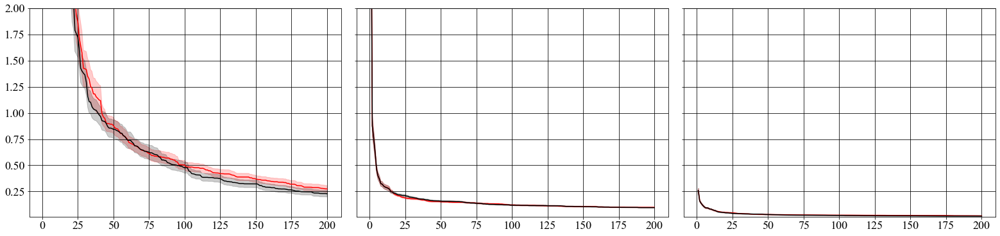

In [13]:
from scipy.stats import wilcoxon


def data_extractor(
    dir_name,
    bench_name,
    opt_names,
    constraint_keys,
    dataset,
    ax,
    n_evals_set=[49, 99, 149, 199]
):
    dc = ExperimentCollector(
        dir_name=dir_name,
        bench_name=bench_name,
        opt_names=opt_names,
        dataset=dataset,
        constraint_keys=constraint_keys,
        feasible_domains=[100]
    ).data_collectors
    _data = {}

    for domain_size in dc.keys():
        _data[domain_size] = {}
        for opt_name in dc[domain_size].keys():
            dc[domain_size][opt_name].compute_cum_loss()
            loss = dc[domain_size][opt_name].cum_loss[:, n_evals_set]
            _data[domain_size][opt_name] = np.median(loss, axis=0)
            
            loss = dc[domain_size][opt_name].get_cum_absolute_percentage_loss()
            m, s = loss.mean(axis=0), loss.std(axis=0) / np.sqrt(50)
            label, color = LABEL_DICT[opt_name], COLOR_DICT[opt_name]
            ax.plot(np.arange(m.size) + 1, m, label=label, color=color)
            ax.fill_between(np.arange(m.size) + 1, m - s, m + s, label=label, color=color, alpha=0.2)

    ax.grid(which='minor', color='gray', linestyle=':')
    ax.grid(which='major', color='black')

    return _data


def get_data(opt_names, remove_constraint=None):
    data = {}
    n_rows, n_cols = 1, 3
    fig, axes = plt.subplots(
        nrows=n_rows,
        ncols=n_cols,
        sharex=True,
        sharey=True,
        figsize=(27, 6),
        gridspec_kw={
            'wspace': 0.05,
            'hspace': 0.125
        }
    )
    ylim = (1e-2, 2)
    index = 0
    constraint_keys = ["runtime", "n_params"]

    dir_name = get_constraint_directory(constraint_keys)
    tag = get_constraint_tag(constraint_keys)

    data[tag] = {}
    index = 0
    for bench_name, choice in zip(["hpolib", "nasbench101", "nasbench201"], ["slice_localization", "cifar10A", "imagenet"]):
        ax = axes[index]
        ax.set_ylim(ylim)
        index += 1
        if choice == 'cifar10C':
            continue

        print(f'{LABEL_DICT[bench_name]}: {LABEL_DICT[choice]}')
        if bench_name == 'nasbench201' and 'n_params' in constraint_keys:
            constraint_keys = [k if k != 'n_params' else 'size_in_mb' for k in constraint_keys]

        data[tag][choice] = data_extractor(dir_name, bench_name, opt_names, constraint_keys, choice, ax)

    plt.show()
    return data


data = get_data(opt_names=["tpe", "vanilla_tpe"])

In [16]:
def check_ok_ratio(bench_name, dataset_name):
    cstr, domain_size = 'runtime', 90
    ec = ExperimentCollector(
        dir_name=f'results/{cstr}',
        bench_name=bench_name,
        opt_names=['tpe', 'vanilla_tpe'],
        dataset=dataset_name,
        feasible_domains=[domain_size],
        constraint_keys=[cstr]
    )

    n_seeds, start, end = 50, 100, 200

    threshold = ec.data_collectors[domain_size]['tpe'].constraints[cstr]

    for r, (opt_name, ax) in enumerate(zip(['tpe', 'vanilla_tpe'], axes)):
        cstr_vals = ec.data_collectors[domain_size][opt_name].cstr_vals[cstr][:n_seeds, start:end].flatten()
        loss = ec.data_collectors[domain_size][opt_name].loss[:n_seeds, start:end].flatten()
        ok = cstr_vals <= threshold
        print(opt_name)
        print(f"OK: {np.sum(ok)}, NG: {np.sum(~ok)}")

In [17]:
check_ok_ratio(bench_name="nasbench101", dataset_name="cifar10A")
check_ok_ratio(bench_name="nasbench201", dataset_name="cifar10")

tpe
OK: 4307, NG: 693
vanilla_tpe
OK: 4161, NG: 839
tpe
OK: 4376, NG: 624
vanilla_tpe
OK: 2593, NG: 2407
